In [35]:
# Initial imports
from dotenv import load_dotenv
import os
import pandas as pd
import numpy as np
from datetime import date
from datetime import timedelta
import plotly.express as px
import plotly.graph_objects as go
import hvplot.pandas
import alpaca_trade_api as tradeapi
from MCForecastTools import MCSimulation

# Note: Consolidate API calls in data_service module
import data_service as ds

%matplotlib inline

In [36]:
# Load .env enviroment variables
load_dotenv()

True

In [37]:
# Get API keys
coin_api_key = os.getenv('COIN_API_KEY') 
alpaca_api_key = os.getenv("ALPACA_API_KEY")
alpaca_secret_key = os.getenv("ALPACA_SECRET_KEY")

In [4]:
# type(coin_api_key)

In [38]:
api = tradeapi.REST(
    alpaca_api_key,
    alpaca_secret_key,
    api_version = "v2")

In [39]:
# Common date params
ticker = "GLD"
timeframe = "1D"
start_date = pd.Timestamp("2016-01-01", tz="America/New_York").isoformat()
end_date = pd.Timestamp("2021-01-01", tz="America/New_York").isoformat()

In [40]:
gld_raw_df = api.get_barset(
    ticker,
    timeframe,
    start=start_date,
    end=end_date).df

In [41]:
gld_raw_df.head()

GLD                                   
                             open     high      low   close   volume
time                                                                
2016-01-04 00:00:00-05:00  103.13  103.670  102.485  102.87  5226833
2016-01-05 00:00:00-05:00  103.13  103.460  102.930  103.18  2968407
2016-01-06 00:00:00-05:00  104.39  104.800  103.930  104.66  8212823
2016-01-07 00:00:00-05:00  105.83  106.237  105.190  106.15  9614677
2016-01-08 00:00:00-05:00  105.48  105.800  105.040  105.66  6001522

In [42]:
# Set number of simulations
num_sims = 500

# Configure a Monte Carlo simulation to forecast 5 years daily returns
MC_GLD = MCSimulation(
    portfolio_data = gld_raw_df,
    num_simulation = num_sims,
    num_trading_days = 252 * 5)

In [43]:
# Run Monte Carlo simulations to forecast one year daily returns
MC_GLD.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.007790,1.006315,0.998263,0.992599,0.983598,1.005034,1.014557,1.004114,0.996651,0.982087,...,1.014574,0.977536,1.002710,1.005867,0.989222,0.980155,0.993142,0.993227,1.009081,1.004795
2,1.004267,1.005840,0.992742,0.997269,0.980054,1.017895,1.015072,1.015654,0.983452,0.989680,...,1.029804,0.997296,1.003385,1.004933,0.992407,0.973347,0.997651,0.989197,1.002937,1.000104
3,1.010230,1.004047,1.000547,0.992601,0.996844,1.014931,1.015640,1.033909,0.970624,0.978474,...,1.037406,0.996465,1.020509,0.989989,1.004594,0.956100,1.001824,0.978481,1.017413,1.008457
4,1.009601,1.000283,0.993365,0.979010,1.005579,1.028444,1.017849,1.045483,0.979557,0.969330,...,1.032686,1.004036,1.019487,0.994399,1.008330,0.955030,0.985492,0.983920,1.014268,1.000769
5,0.993747,1.000657,0.991358,0.977528,0.994632,1.033883,1.027300,1.041355,0.996836,0.976664,...,1.033881,1.001481,1.019224,0.989140,1.010034,0.959017,0.978076,0.989851,1.014610,0.996147
6,0.985358,0.998190,1.007658,0.977012,1.003291,1.039407,1.031451,1.026863,1.002127,0.982718,...,1.035083,0.999143,1.014492,0.966149,1.010802,0.947394,0.977630,1.001487,1.012783,1.000213
7,0.990614,0.994196,1.016977,0.986484,0.997393,1.026257,1.032386,1.016856,1.000214,0.986257,...,1.038786,1.001058,0.996851,0.962732,1.027532,0.957292,0.975103,1.006253,1.007700,1.008149
8,0.992724,0.993168,0.998337,0.987627,0.994334,1.017209,1.034562,1.014505,0.983634,0.981682,...,1.052277,0.997822,0.999451,0.969727,1.041073,0.974914,0.983749,1.012259,1.014301,1.009215
9,0.995242,0.990587,0.989633,0.991703,1.003777,0.991815,1.043855,1.032771,0.985937,0.981499,...,1.061717,1.012638,1.002325,0.971781,1.028758,0.976164,0.997360,1.012702,1.013033,1.013735


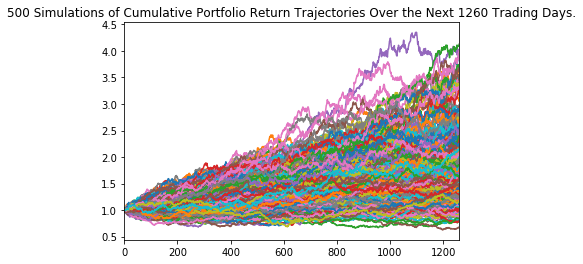

In [44]:
# Plot simulation outcomes
gld_line_plot = MC_GLD.plot_simulation()

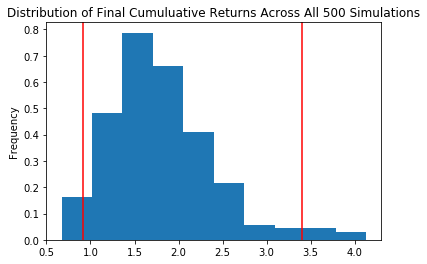

In [46]:
gld_dist_plot = MC_GLD.plot_distribution()

In [47]:
# need to format to multi-level column
btc_df = ds.get_crypto_OHLCV(coin_api_key, 'BTC', '2016-01-01', '2021-01-01', '1DAY')

In [48]:
btc_df.head()

,date,open,high,low,close,volume


In [33]:
# df=pd.DataFrame({'a':[1,2,3],'b':[4,5,6]})
# columns=[('c','a'),('c','b')]
# df.columns=pd.MultiIndex.from_tuples(columns)

# df = pd.DataFrame({'BTC': [btc_df['date'], btc_df['open']]})

# Need to format similar to Alpaca dataset
btc_df.columns=pd.MultiIndex.from_tuples([('BTC','date'),('BTC','open'),('BTC','high'),('BTC','low'),('BTC','close'),('BTC','volume')])


ValueError: Length mismatch: Expected axis has 5 elements, new values have 6 elements

In [34]:
btc_df.index = btc_df['BTC']['date']
btc_df.drop(columns=('BTC','date'), inplace=True)

KeyError: 'date'

In [16]:
btc_df.head()

BTC                                         
              open    high        low   close        volume
date                                                       
2016-01-02  430.35  437.15  427.20000  433.82   7665.737205
2016-01-03  435.67  437.56  430.32476  435.40   6274.264733
2016-01-04  433.20  435.75  422.98000  431.91   8499.043386
2016-01-05  431.54  435.86  426.56000  434.17  11652.260666
2016-01-06  433.31  435.64  429.00000  433.34   9065.912403

In [17]:
# Set number of simulations
num_sims = 500

# Configure a Monte Carlo simulation to forecast one year daily returns
MC_BTC = MCSimulation(
    portfolio_data = btc_df,
    num_simulation = num_sims,
    num_trading_days = 252 * 5)

In [20]:
MC_BTC.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.005907,1.007855,1.025710,1.055170,0.944210,1.034916,1.004952,1.028488,0.997203,1.029702,...,0.954546,1.071046,0.985423,1.003969,1.020942,0.996458,0.968888,0.988189,1.033834,1.002423
2,0.967956,0.978698,1.120022,1.073718,0.909389,1.044456,0.980953,0.981714,0.986211,0.986680,...,0.955058,1.098874,0.972738,1.008005,1.069185,1.009698,0.921723,0.977473,0.992712,1.023340
3,0.931100,0.971435,1.131997,1.085060,0.940021,1.059831,0.955040,0.957699,0.996268,0.925985,...,0.938869,1.042603,0.928557,1.004562,1.094453,0.976839,0.860943,1.004801,0.977549,0.990346
4,0.895754,0.929140,1.182582,1.100062,0.985089,1.067273,0.924796,0.926344,1.029662,0.974130,...,0.908074,1.015965,0.952289,1.032322,1.107672,0.964880,0.839115,0.993892,1.059203,1.072299
5,0.876114,0.923098,1.181294,1.100030,0.945543,1.102214,0.906997,0.996600,1.048146,0.957127,...,0.938535,1.032445,0.967120,1.130572,1.093948,0.966032,0.862429,1.042315,1.063304,1.040561
6,0.890554,0.982009,1.253938,1.069969,0.982110,1.102848,0.890692,1.022822,1.103822,0.964591,...,0.931374,1.043647,0.991040,1.121417,1.153825,0.950117,0.843606,1.054517,1.073887,1.005623
7,0.892283,0.996211,1.360119,0.997714,0.994794,1.092939,0.888797,1.026080,1.099653,0.907762,...,0.966922,1.041696,0.996536,1.174909,1.174304,0.955826,0.842368,1.128580,1.042012,1.111568
8,0.890047,0.926512,1.315055,1.002852,0.982459,1.195842,0.916166,0.955853,1.071947,0.911296,...,1.004430,0.988171,1.026787,1.108049,1.169120,0.928947,0.916057,1.155120,1.078150,1.008842
9,0.929114,0.934108,1.208184,1.017513,0.999896,1.084065,0.854268,0.920691,1.091566,0.928515,...,1.059477,0.974649,1.054671,1.125583,1.096681,0.929167,0.911960,1.235217,1.066077,1.089983


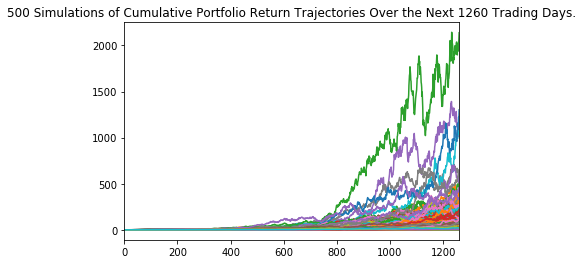

In [21]:
btc_line_plot = MC_BTC.plot_simulation()

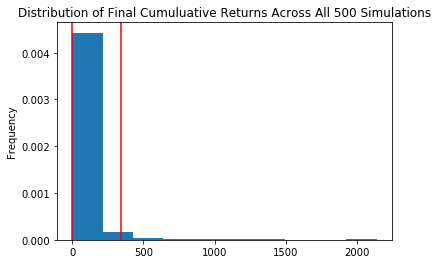

In [22]:
dist_plot = MC_BTC.plot_distribution()

In [ ]:
# btc_mc_summary_stats = MC_30_yrs.summarize_cumulative_return()